## <font color=blue> Project: Churn Fortune Teller </font>

__Group:__ 1<br>
__Team Members:__<br>
1) Anirban Kar Chaudhuri (A0108517H) <br>
2) Maradana Vijaya Krishna (A0178453W) <br>
3) Putrevu Manoj Niyogi (A0213557E) <br>
4) Sivasankaran Balakrishnan (A0065970X)

## <font color=blue>Objectives: Exploratory Data Analysis </font>
Produce Visualisations to understand importance of all predictor variables, as well as their
underlying data distribution.<br>
That will enable us to determine the meanings and importance of various predictor variables in how they influence
prediction of churn customers.<br>
Lastly, k-means clustering carried out to profile customers by their tenure and monthly charge.

## <font color=blue>Overview: </font>

1) Importing Data & Examing Data Types<br><br>
2) Data Visualisation
   - 2.1 Categorical Influencers<br>
   - 2.2 Numerical Influencers <br>
   
3) Cluster Analysis Based Tenure and Monthly Charges<br>
4) Boxplots Of Monthly Charges Against Categorical Predictors

## 1) Importing Data & Examing Data Types

In [1]:
#Importing libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd #visualization
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns

churn_data=pd.read_csv("Telco-Customer-Churn.csv")
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [2]:
churn_data.TotalCharges = pd.to_numeric(churn_data.TotalCharges, errors='coerce')
churn_data.TotalCharges = churn_data.TotalCharges.fillna(method='ffill')

There are 11 missing values under 'TotalCharges' column.

In [3]:
churn_data.TotalCharges = pd.to_numeric(churn_data.TotalCharges, errors='coerce')
churn_data.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [4]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [5]:
churn_data.nunique() #Number of unique values for categorical variables

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6530
Churn                  2
dtype: int64

In [6]:
print(churn_data["Churn"].value_counts()/len(churn_data)*100)

No     73.463013
Yes    26.536987
Name: Churn, dtype: float64


### 2) Exploratory Data Analysis

In [7]:
#Separating catagorical and numerical columns
Id_col     = ['customerID']
target_col = ["Churn"]
cat_cols   = churn_data.nunique()[churn_data.nunique() < 6].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col] #categorical predictor variables
num_cols   = [x for x in churn_data.columns if x not in cat_cols + target_col + Id_col] #numerical predictor variables

__References for plots:__ <br>
Udemy course on plotly & dash: https://github.com/Pierian-Data/Plotly-Dashboards-with-Dash<br>
Plotly website basic tutorials: https://plotly.com/python/line-and-scatter/#line-plot-with-plotly-express<br>
Plotly colors: https://plotly.com/python/discrete-color/<br>

### 2.2 Customer Attrition based on categorical influencers

In [8]:
#Separating churn and non churn customers
churn = churn_data[churn_data["Churn"] == "Yes"]
not_churn = churn_data[churn_data["Churn"] == "No"]

In [9]:

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go#visualization


def plot_pie(column) :
    trace1 = go.Pie(values  = churn[column].value_counts().values.tolist(),
                    labels  = churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Churn Customers",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")),
                    hole    = .6
                   )
    trace2 = go.Pie(values  = not_churn[column].value_counts().values.tolist(),
                    labels  = not_churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Non churn customers" 
                   )
    layout = go.Layout(dict(title = column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .15, y = .5),
                                           dict(text = "Non churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .88,y = .5
                                               )
                                          ]
                           )
                      )
    data = [trace1,trace2]
    fig  = go.Figure(data = data,layout = layout)
    py.iplot(fig)

In [10]:
#for all categorical columns plot pie
for i in cat_cols :
    plot_pie(i)

__Inferences from pie chars:__<br>
1) Gender is not a good indicator of churn <br>
2) Customers that doesn't have partners are more likely to churn <br>
3) Customers without dependents are also more likely to churn <br>
4) Customers who are on month-to-month contract are likely to abandon company services <br>
5) Customers who have internet available, opt for paperless billing and automatic payment services are more
   likely to churn. These groups of customers tend   to be tech savvy, read widely and be updated on latest market 
   trends and rates.<br>
6) Customers who enjoy premium stream services are likely to leave, if they are lured by competitors offering
   similar services whose prices are competitive and offer better quality.<br>
7) Customers also tend to leave because of lack of technical support and online security as they're unlikely to find success in    a company's products.<br>
8) Presence of phone service, especially multiple lines drive churn.

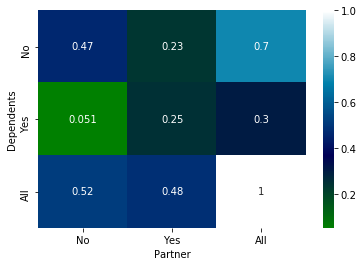

In [11]:
sns.heatmap(pd.crosstab(churn_data.Dependents, churn_data.Partner, normalize='all', margins=True), annot=True, cmap='ocean')

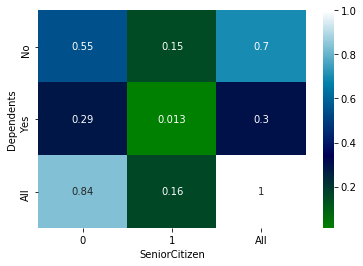

In [12]:
sns.heatmap(pd.crosstab(churn_data.Dependents, churn_data.SeniorCitizen, normalize='all', margins=True), annot=True, cmap='ocean')


Senior citizens have a higher probability of having dependents.<br>
People without partners generally do not have dependents.

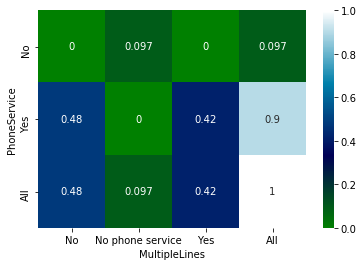

In [13]:
sns.heatmap(pd.crosstab(churn_data.PhoneService, churn_data.MultipleLines, normalize='all', margins=True), annot=True, cmap='ocean')


Those with phoneservices have equal probability of having mutliple phone lines.<br>
<br>Multiple lines is not actually a strong predictor.

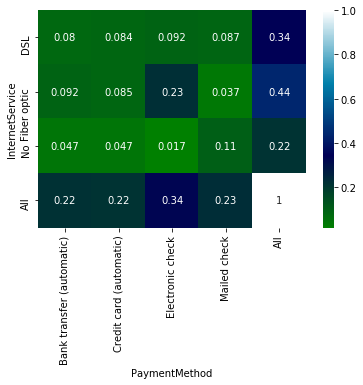

In [14]:
sns.heatmap(pd.crosstab(churn_data.InternetService,churn_data.PaymentMethod, normalize='all', margins=True), annot=True, cmap='ocean')


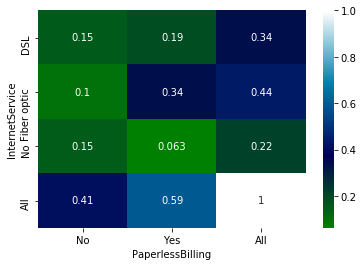

In [15]:
sns.heatmap(pd.crosstab(churn_data.InternetService,churn_data.PaperlessBilling, normalize='all', margins=True), annot=True, cmap='ocean')


People who opt for paperless billing tend to utilise internet service. <br>
Those with internet service have a clearcut preference for automatic transfers, especially Fiber optic subscribers.
Those without internet services tend to use mailed check mostly.

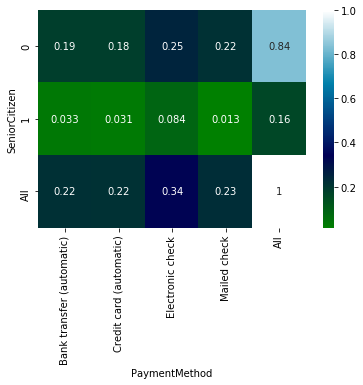

In [16]:
sns.heatmap(pd.crosstab(churn_data.SeniorCitizen,churn_data.PaymentMethod, normalize='all', margins=True), annot=True, cmap='ocean')


People generally prefer manual transfer, probably due to safety reasons as well as lower cost, compared to automatic transfers.<br>
This is regardless of age.

### 2.2 Customer Churn Analysis based on numeric influencers

In [17]:
#function  for histogram for customer attrition types
def plot_histogram(column) :
    trace1 = go.Histogram(x = churn[column],
                          histnorm = "percent",
                          name = "Churn Customers",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),   
                         opacity = .6 
                         ) 
    
    trace2 = go.Histogram(x = not_churn[column],
                          histnorm = "percent",
                          name = "Non churn customers",
                          marker = dict(line = dict(width = .5,
                                              color = "black"
                                             )
                                 ),
                          opacity = .6
                         )         
    
    data = [trace1,trace2]
    layout = go.Layout(dict(title =column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(300,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           ))
    fig  = go.Figure(data=data,layout=layout)
    py.iplot(fig)

In [18]:
#for all categorical columns plot histogram    
for i in num_cols :
    plot_histogram(i)


Inferences from histogram diagrams: <br>
1) 39% of the churn customers have a tenure of about 5 months. <br>
2) Churn customers have monthly charges peaked at around $75 per month.<br>
3) Approximately 55% of churn customers have a cumulative total charge of 900 dollars 

In [19]:
import plotly.express as px

def plotly_scatterplot(xc, yc, colour, template, trendline=None):
    fig1 = px.scatter(churn_data, x=xc, y=yc,
                color=colour, render_mode='svg', template=template,
                hover_name="customerID",
                marginal_x=None,
                marginal_y=None, trendline=trendline)
    return fig1

In [20]:
plotly_scatterplot(xc='MonthlyCharges', yc='TotalCharges', colour='Churn', template='plotly_dark',trendline='ols')

In [21]:
plotly_scatterplot(xc='MonthlyCharges', yc='TotalCharges', colour='Contract', template='plotly')

It is understood from the two scatterplots that:

1) Clients with __lower tenure__ are more likely to churn 

2) Clients with __higher MonthlyCharges__ are also more likely to churn

3) Tenure and MonthlyCharges are **very significant** features in determining churn outcome


### 3. Cluster Analysis Based On Monthly Charges and Tenure

K-means clustering can be used to partition the dataset based on tenure and monthly charges, the significant numeric variables. <br>
Purpose is to group instances of similar traits together.<br>
The K in K-Means denotes the number of clusters. <br>
This algorithm initialises cluster centroids that randomly converges to a solution after some point in time <br>
is bound to converge to a solution after some iterations.<br>


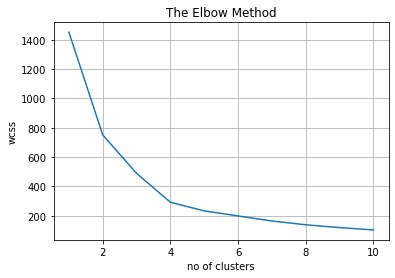

In [22]:
from sklearn.cluster import KMeans 
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

scaler = MinMaxScaler()
churn_data[['MonthlyCharges','tenure']] = scaler.fit_transform(churn_data[['MonthlyCharges','tenure']])


def elbow_plot(data=churn_data[['MonthlyCharges','tenure']]):
    score = []
    for cluster in range(1,11):
        kmeans = KMeans(n_clusters = cluster, init="k-means++", random_state=10)
        kmeans.fit(data)
        score.append(kmeans.inertia_)
    
    plt.plot(range(1,11), score)
    plt.title('The Elbow Method')
    plt.xlabel('no of clusters')
    plt.ylabel('wcss')
    plt.grid()
    return plt.show()

elbow_plot()

•	__Inertia__ is the sum of squared error for each cluster. Therefore, the smaller the inertia the denser the cluster (closer together all the points are) <br>
•	Tip for choosing optimal number of clusters is looking at rate of decrease in inertia for addition of a cluster <br>
•	__Optimal number__ of clusters is __4__ since inertia does not decrease noticeably after additional clusters are added


In [23]:
#Apply kmeans clustering to the entire dataset
kmeans = KMeans(n_clusters = 4, random_state = 1000).fit(churn_data[['MonthlyCharges','tenure']])
churn_data['cluster'] = kmeans.labels_
churn_data[['MonthlyCharges','tenure']] = scaler.inverse_transform(churn_data[['MonthlyCharges','tenure']])


#Plot a plotly interactive scatter plot
fig = px.scatter(churn_data, x='MonthlyCharges', y='tenure',
                color='cluster', render_mode='svg', template='plotly',
                hover_data=['SeniorCitizen','Dependents','Contract','InternetService',
                            'PaperlessBilling','PaymentMethod'],
                hover_name="customerID",
                marginal_x="violin",
                marginal_y="violin")

fig.update_layout(title='Clusters of churned users by monthly charges and tenure',
                  paper_bgcolor='LightBlue')
                      
fig.show()

Overall, clusters are well segregated as seen above.<br>

Cluster 0: High tenure, high monthly charge <br>
Cluster 1: Low tenure, low monthly charge <br>
Cluster 2: Low tenure, high monthly charge <br>
Cluster 3: High tenure, low monthly charge,  <br>


The pivot table below shows mean monthly charges and tenure of senior citizens in a cluster.<br>
The figures in the table can be verified by hovering the cursor over the interactive graph above.

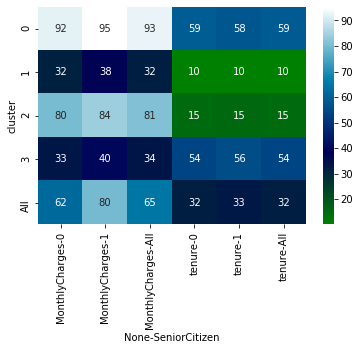

In [24]:
cluster_charges = pd.pivot_table(churn_data, index=['cluster'], columns=['SeniorCitizen'],
                     values=['MonthlyCharges','tenure'], margins=True, aggfunc='mean')

sns.heatmap(cluster_charges, annot=True, cmap='ocean')

In [25]:
churn_data['cluster'].value_counts() #count distribution of clusters

2    2241
0    1941
1    1709
3    1152
Name: cluster, dtype: int64

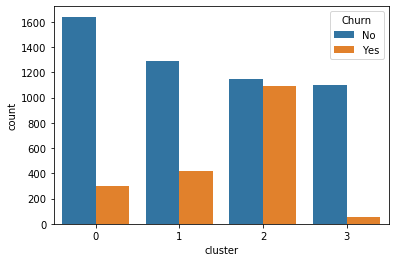

In [26]:
sns.countplot('cluster',hue='Churn',data=churn_data, orient='h')

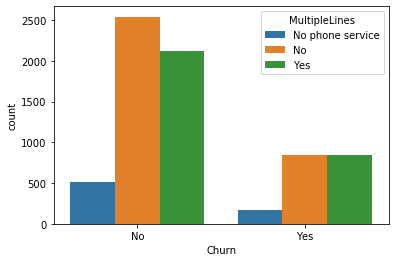

In [27]:
sns.countplot('Churn', hue='MultipleLines',data=churn_data, orient='h')

Overall, clusters are well segregated as seen above.

Cluster 0: High tenure, high monthly charge
Cluster 1: Low tenure, low monthly charge
Cluster 2: Low tenure, high monthly charge
Cluster 3: High tenure, low monthly charge,

Clusters with descending order of churning probability: 2, 1, 0, 3 <br><br>

Cluster 3 is defined by high tenure and low, monthly charges, __ideal for retaining customers__.<br>
Customers in category 2 (low tenure and high monthly charges), have highest probability of churning.<br>
Cluster 0 customers have high tenure but high monthly charge. This shows monthly charge also an important predictor.

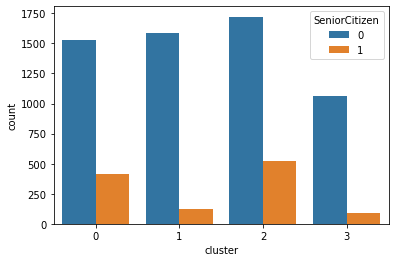

In [28]:
sns.countplot('cluster',hue='SeniorCitizen',data=churn_data, orient='h')

Senior citizens fall under clusters 0 and 2, clusters with high monthly charge. This means high monthly charge is problematic for senior citizens.

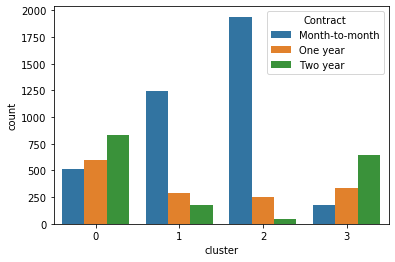

In [29]:
sns.countplot('cluster',hue='Contract',data=churn_data, orient='h')

Customers of over two year contracts are found in clusters with high tenure.
Customers of month-to-month contract are found in clusters with low tenure and they cause churn signficantly.

## 4. Boxplots Measuring Monthly Cost Against Amenities and Securities

Let's investigate monthly charge

In [30]:
def plot_boxplot(column):
    fig = px.box(churn_data, x=column, y="MonthlyCharges", color="Churn",points="outliers", 
                 hover_name="customerID",template='plotly')
    fig.update_traces(quartilemethod="inclusive")
    fig.update_layout(title='Monthly Charges against {} Segregated By Churn and Non-Churn Customers'.format(column))
    return fig.show()

In [31]:
for cols in ['MultipleLines','OnlineSecurity','StreamingTV','PaperlessBilling','PaymentMethod','SeniorCitizen']:
    plot_boxplot(cols)

__Boxplot Inferences:__<br>
1) Senior citizens tend to have higher cost monthly, even for those in churn groups. They are likely to churn but bring great benefits in revenue.<br>
2) Manual payment through checks are less costlier. Mailed check payment has largest range.<br>
3) Presence of internet increases monthly cost significantly. Addition of streaming cost poses greater costs.<br>
4) Having phoneline increases cost. Multiple phonelines raises monthly cost.<br>
5) High increases in costs due to internet and phone related services increases probability of churn.<br>

In [32]:
churn_data.to_pickle("customer_churn_data.pkl")